In [1]:
import numpy as np
from matplotlib import pyplot as plt

from astropy.io import fits
from astropy.modeling import models, fitting
from photutils.aperture import CircularAperture
from photutils.aperture import aperture_photometry

%matplotlib inline
#%config InlineBackend.figure_format='retina'
#!pip install git+https://github.com/M-Bianchi/My_matplotlib_style
plt.style.use('mystyle')
plt.rcParams['axes.grid'] = False

In [2]:
# Function to open the fits file and plot them
def Open_Fits(filepath, plot, cmap='gnuplot2'):
    file_temp = fits.open(filepath)
    file = file_temp[0].data
    file_temp.close()
    if plot == True:
        plt.imshow(file, clim=(0, np.quantile(file, [0.99])), cmap=cmap, origin='lower')
        plt.colorbar(fraction=0.0375, pad=0.02);
    return file

$m_\text{true} = \text{ZP} + m_\text{instrument}$

$-2.5 \log_{10} f_\lambda = \text{ZP} - 2.5 \log_{10} R[e^-/s] \:\:\: \Longrightarrow \:\:\: f_\lambda [erg/s/cm^2/\AA] = 10^{-0.4 \text{ZP}} R[e^-/s]$ 

In order to obtain ZP, we have to estimate $m_\text{physical}$ from calibration stars. We use the SDSS catalogue.

TOBI_ha = SDSS_r -0.2568 * (SDSS_g-SDSS_r) + 0.1470

TOBI_hb =  SDSS_g -0.2322 * (SDSS_g-SDSS_r) + -0.0024

TOBI_g   = SDSS_g -0.1205 * (SDSS_g-SDSS_r) + 0.0012

TOBI_r    = SDSS_r -0.0061 * (SDSS_g-SDSS_r) + 0.0001

TOBI_i    = SDSS_i -0.0609 * (SDSS_r-SDSS_i) + 0.0049

In [3]:
def ZeroPoint(filter, ourmagnitude, stars_rmag, stars_gmag, stars_imag):
    if filter == 'Ha':
        Tobi = stars_rmag -0.2568 * (stars_gmag-stars_rmag) + 0.1470
    elif filter == 'Hb':
        Tobi = stars_gmag -0.2322 * (stars_gmag-stars_rmag) - 0.0024 
    elif filter == 'g':
        Tobi = stars_gmag -0.1205 * (stars_gmag-stars_rmag) + 0.0012
    elif filter == 'r':
        Tobi = stars_rmag -0.0061 * (stars_gmag-stars_rmag) + 0.0001
    elif filter == 'i':
        Tobi = stars_imag -0.0609 * (stars_rmag-stars_imag) + 0.0049

    return np.mean(Tobi - ourmagnitude)

# Filter Ha

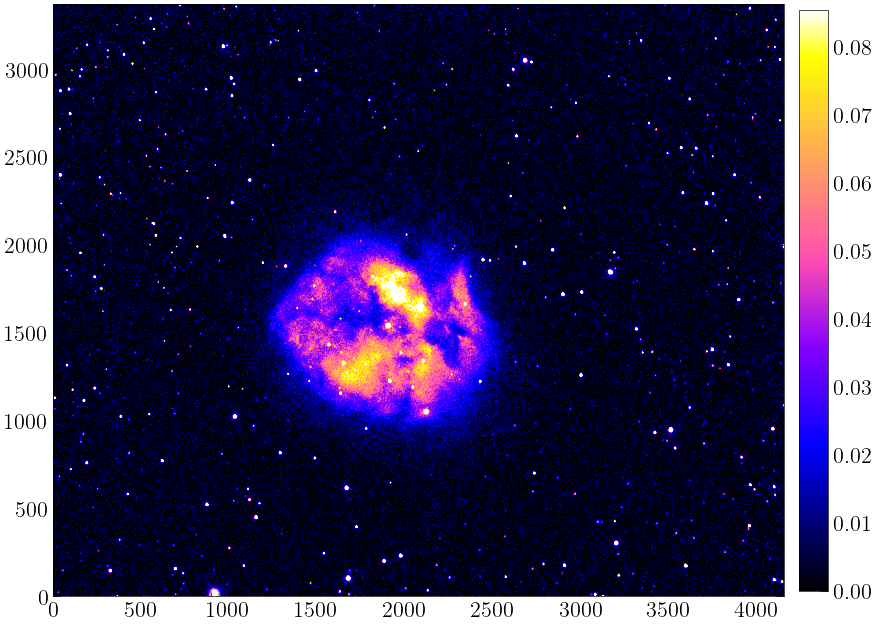

In [4]:
final_Ha = Open_Fits(filepath='Data/final_Ha.fits', plot=True)

In [5]:
final_Ha_radec = fits.open('Data/final_Ha_radec.fits')[1].data
final_Ha_radec

FITS_rec([(328.6532846 , 47.15560772,  921.82434 , 1.74548531e+01, 3.45572052e+01, 0.00260925),
          (328.37017436, 47.26660542, 1907.9147  , 1.53818115e+03, 9.16756153e+00, 0.04750919),
          (328.12018925, 47.38700367, 2686.7764  , 3.04577710e+03, 7.69480991e+00, 0.0024128 ),
          (328.37558545, 47.2012023 , 2125.0745  , 1.04945142e+03, 6.86020613e+00, 0.02323532),
          (328.1420862 , 47.22878445, 3172.8506  , 1.84244763e+03, 6.70983076e+00, 0.00212526),
          (328.16143343, 47.1119084 , 3515.8984  , 9.45524536e+02, 4.97167635e+00, 0.0022378 ),
          (328.39010883, 47.49197238,  970.0183  , 3.12536255e+03, 3.22498703e+00, 0.00243759),
          (328.33571165, 47.44714909, 1404.0621  , 2.93674268e+03, 1.34269893e+00, 0.0023849 ),
          (328.52438474, 47.12269255, 1681.8555  , 1.02863037e+02, 5.45206022e+00, 0.00224209),
          (328.55278954, 47.25886365, 1036.0205  , 1.02124268e+03, 3.96849036e+00, 0.00243831),
          (328.26415876, 47.05925134, 32

In [6]:
print(np.min(final_Ha_radec['ra']), np.max(final_Ha_radec['ra']))
print(np.min(final_Ha_radec['dec']), np.max(final_Ha_radec['dec']))

327.861475729151 328.7958090865958
46.9823001142356 47.5606852155633


In [7]:
SDSS_catalogue = fits.open('Data/SDSS_catalogue_15_16.fit')[1].data
SDSS_catalogue

FITS_rec([(328.58057361, 46.98690832, 328.580579, 46.986901, 1, '', 6, 'J215419.33+465912.8', '', 2006.394, 3, 17.159, 0.009, 15.681, 0.003, 15.105, 0.003, 14.919, 0.004, 14.751, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.42941082, 46.98918789, 328.429424, 46.989194, 1, '+', 6, 'J215343.06+465921.0', '*', 2006.394, 3, 17.328, 0.01, 15.886, 0.003, 15.256, 0.003, 14.974, 0.004, 14.82, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.43438273, 46.99230979, 328.434395, 46.992307, 1, '+', 6, 'J215344.25+465932.3', '', 2006.394, 3, 17.388, 0.01, 15.982, 0.003, 15.368, 0.003, 15.092, 0.004, 14.942, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.49950121, 46.9958261, 328.499434, 46.995823, 1, '+', 6, 'J215359.86+465944.9', '', 2006.394, 3, 17.341, 0.01, 15.865, 0.003, 15.232, 0.003, 14.918, 0.004, 14.739, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.55587919, 47.01212553, 328.555905, 47.012129, 1, '', 3, 'J215413.41+470043.6', '', 2006.394, 3, 17.272, 0.01, 15.752, 0.003, 15.176, 0.003, 14.931, 0.004, 14.

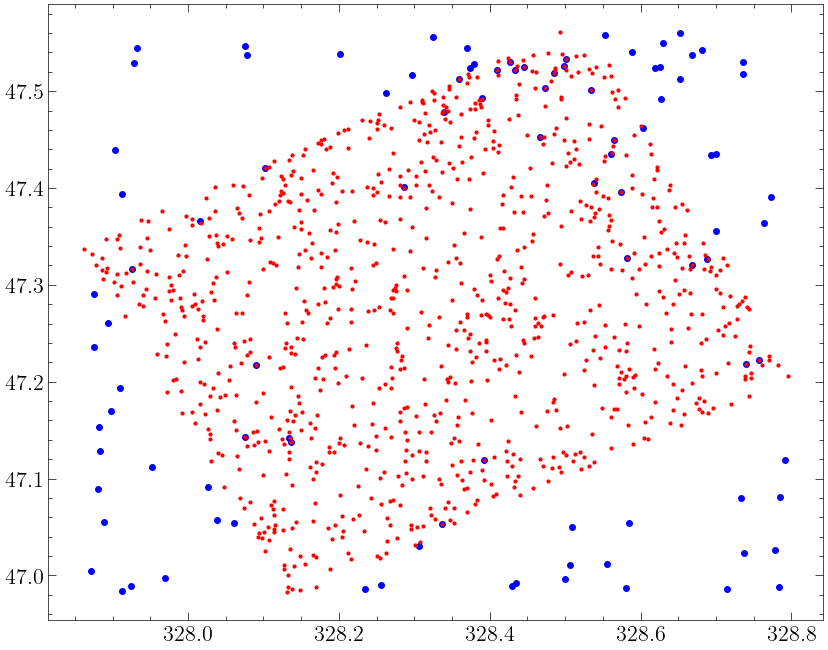

In [8]:
for i in range(len(SDSS_catalogue['_RAJ2000'])):
    plt.plot(SDSS_catalogue['_RAJ2000'][i], SDSS_catalogue['_DEJ2000'][i], c='blue', marker='o', markersize=4)

for i in range(len(final_Ha_radec['ra'])):
    plt.plot(final_Ha_radec['ra'][i], final_Ha_radec['dec'][i], c='red', marker='o', markersize=2)

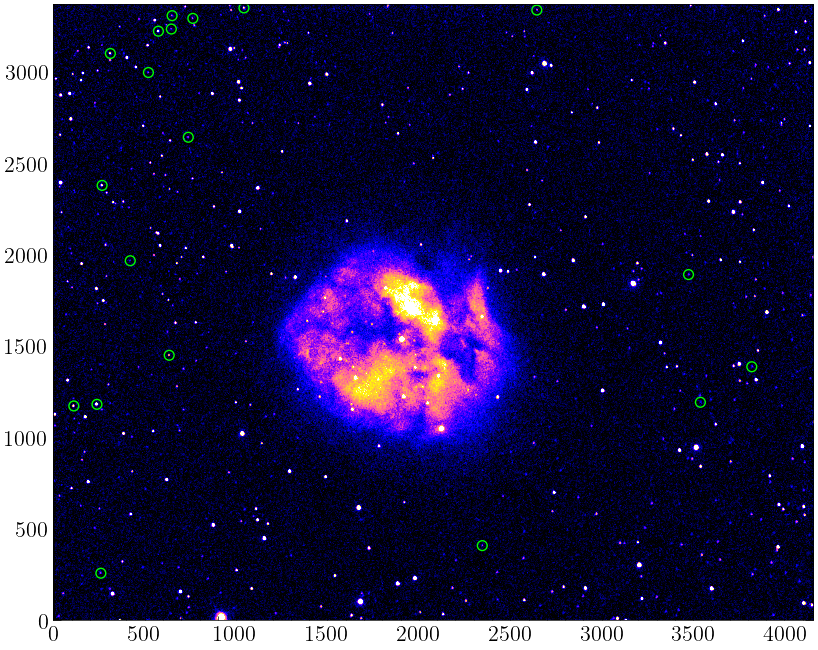

In [9]:
stars_x = []
stars_y = []
stars_gmag = []
stars_rmag = []
stars_imag = []
stars_ra = []   # useless in this code, but can be used to identify the star at https://skyserver.sdss.org/dr18/VisualTools/navi/
stars_dec = []  # ...

for i in range(len(SDSS_catalogue['_RAJ2000'])):
    # Find the matches between SDSS stars and our stars
    mask_ra = np.isclose(final_Ha_radec['ra'], SDSS_catalogue['_RAJ2000'][i], atol=0, rtol=0.0000015)
    mask_dec = np.isclose(final_Ha_radec['dec'], SDSS_catalogue['_DEJ2000'][i], atol=0, rtol=0.0000015)
    mask_tot = np.logical_and(mask_ra, mask_dec)
    
    # If there is only one match, append the coordinates (from astrometry.net) and magnitudes (from SDSS catalogue)
    # If there is no match or more than one match, do nothing
    if np.sum(mask_tot) == 1:
        # extra masks to reduce the change of having a second star partially overlapping the first one
        mask_ra = np.isclose(final_Ha_radec['ra'], SDSS_catalogue['_RAJ2000'][i], atol=0, rtol=0.000003)
        mask_dec = np.isclose(final_Ha_radec['dec'], SDSS_catalogue['_DEJ2000'][i], atol=0, rtol=0.000003)
        mask_tot = np.logical_and(mask_ra, mask_dec)
    
        if np.sum(mask_tot) == 1:
            stars_x.append(final_Ha_radec['x'][mask_tot][0])
            stars_y.append(final_Ha_radec['y'][mask_tot][0])
            stars_gmag.append(SDSS_catalogue['gmag'][i])
            stars_rmag.append(SDSS_catalogue['rmag'][i])
            stars_imag.append(SDSS_catalogue['imag'][i])
            stars_ra.append(SDSS_catalogue['_RAJ2000'][i])
            stars_dec.append(SDSS_catalogue['_DEJ2000'][i])
        
stars_x = np.array(stars_x)
stars_y = np.array(stars_y)
stars_gmag = np.array(stars_gmag)
stars_rmag = np.array(stars_rmag)
stars_imag = np.array(stars_imag)
stars_ra = np.array(stars_ra)
stars_dec = np.array(stars_dec)
        
plt.imshow(final_Ha, clim=(0, np.quantile(final_Ha, [0.99])), cmap='gnuplot2', origin='lower')

for i in range(len(stars_x)):
    plt.scatter(stars_x[i], stars_y[i], facecolors='none', edgecolors='lime', s=50)

In [10]:
def Aperture_Photometry(image, stars_x, stars_y, stars_ra, stars_dec, stars_gmag, stars_rmag, stars_imag, rectangle_side=40, fwhm_factor=3):
    ourfluxes = []

    fig, ax = plt.subplots(figsize=(18,12))
    ax.imshow(image, clim=(0, np.quantile(image, [0.99])), cmap='gnuplot2', origin='lower')

    for i in range(len(stars_x)):
        cutout = image[round(stars_y[i]-rectangle_side/2):round(stars_y[i]+rectangle_side/2), round(stars_x[i]-rectangle_side/2):round(stars_x[i]+rectangle_side/2)]

        # 1) Compute the FWHM of the stars to decide the radius of the circular aperture
        # x projection
        x_projection = np.mean(cutout, axis=0)
        x_fit = np.arange(len(x_projection))
        gaussian = models.Gaussian1D(amplitude=np.max(x_projection), mean=len(x_projection)/2, stddev=len(x_projection)/5)
        fit_gaussian = fitting.LevMarLSQFitter()
        fitted_gaussian = fit_gaussian(gaussian, x_fit, x_projection)
        mean_x = fitted_gaussian.mean[0]
        fwhm_x = 2.355*fitted_gaussian.stddev
        
        fig_temp, axes_temp = plt.subplots(1, 3, figsize=(16,3.5))
        ax_temp = axes_temp[0]
        ax_temp.plot(x_projection, label='Data')
        ax_temp.plot(x_fit, fitted_gaussian(x_fit), label='Fit')
        ax_temp.axhline(0, c='black', linestyle='--', alpha=0.5, zorder=0)
        ax_temp.axvline(mean_x, c='black', linestyle='--', alpha=0.7)
        ax_temp.set_xlabel('y') # In the image, the x-axis of the numpy array becomes the vertical axis!
        
        
        # y projection
        y_projection = np.mean(cutout, axis=1)
        y_fit = np.arange(len(y_projection))
        gaussian = models.Gaussian1D(amplitude=np.max(y_projection), mean=len(y_projection)/2, stddev=len(y_projection)/10)
        fit_gaussian = fitting.LevMarLSQFitter()
        fitted_gaussian = fit_gaussian(gaussian, y_fit, y_projection)
        mean_y = fitted_gaussian.mean[0]
        fwhm_y = 2.355*fitted_gaussian.stddev
        
        ax_temp = axes_temp[1]
        ax_temp.plot(y_projection, label='Data')
        ax_temp.plot(y_fit, fitted_gaussian(y_fit), label='Fit')
        ax_temp.axhline(0, c='black', linestyle='--', alpha=0.5, zorder=0)
        ax_temp.axvline(mean_y, c='black', linestyle='--', alpha=0.7)
        ax_temp.set_xlabel('x') # In the image, the y-axis of the numpy array becomes the horizontal axis!
        
        
        # 2) Redefine the centroid and define the aperture radius
        # the cutout frame, in which mean_x and mean_y are defined, is centered on the left-bottom corner of the rectangle
        aperture_centroid = [round(stars_x[i]-rectangle_side/2)+mean_x, round(stars_y[i]-rectangle_side/2)+mean_y]
        # the aperture radius is a radius, and thus we must divide the FWHM by 2!
        aperture_r = fwhm_factor*np.mean([fwhm_x/2, fwhm_y/2])
        
        
        # 3) Compute the flux of the stars
        aperture = CircularAperture(aperture_centroid, r=aperture_r)
        ourfluxes.append(aperture_photometry(image, aperture)['aperture_sum'][0])
        
        
        # Final plots
        ax_temp = axes_temp[0]
        ax_temp.axvline(mean_x-aperture_r, c='red', linestyle='--')
        ax_temp.axvline(mean_x+aperture_r, c='red', linestyle='--')
        
        ax_temp = axes_temp[1]
        ax_temp.axvline(mean_y-aperture_r, c='red', linestyle='--')
        ax_temp.axvline(mean_y+aperture_r, c='red', linestyle='--')
        
        ax_temp = axes_temp[2]
        ax_temp.imshow(cutout, clim=(0, np.quantile(cutout, [0.99])), cmap='gnuplot2', origin='lower')
        ax_temp.plot(mean_x, mean_y, marker='o', markersize=3, color='lime')
        circle_plot = plt.Circle([mean_x, mean_y], aperture_r, color='lime', linewidth=1.5, fill=False)
        ax_temp.add_patch(circle_plot)
        
        circle_plot = plt.Circle(aperture_centroid, aperture_r, color='lime', linewidth=0.8, fill=False)
        ax.add_patch(circle_plot)
        ax.text(aperture_centroid[0]+1.5*aperture_r, aperture_centroid[1]-0.8*aperture_r, f'{i}', fontsize=15, color='lime')
        
        fig_temp.suptitle(f'Star {i} (ra={stars_ra[i]:.4f}, dec={stars_dec[i]:.4f})  (g_SDSS={stars_gmag[i]:.2f}, r_SDSS={stars_rmag[i]:.2f}, i_SDSS={stars_imag[i]:.2f})   (e/s={ourfluxes[i]:.2f})', fontsize=20)
        
    
    return np.array(ourfluxes)

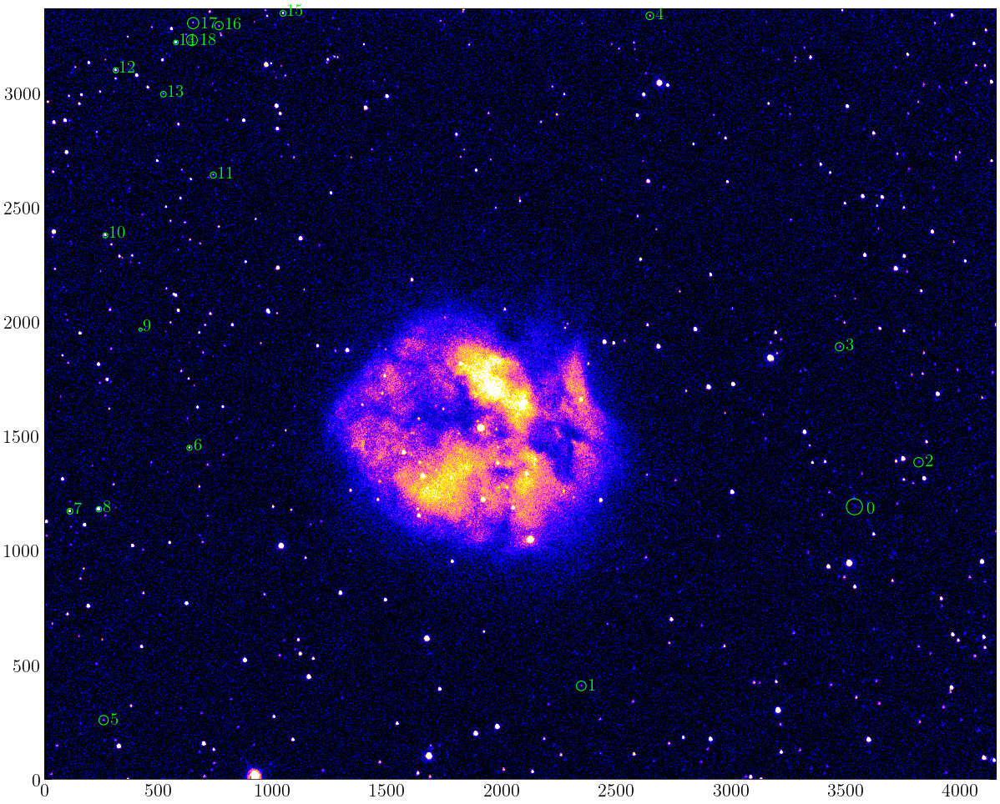

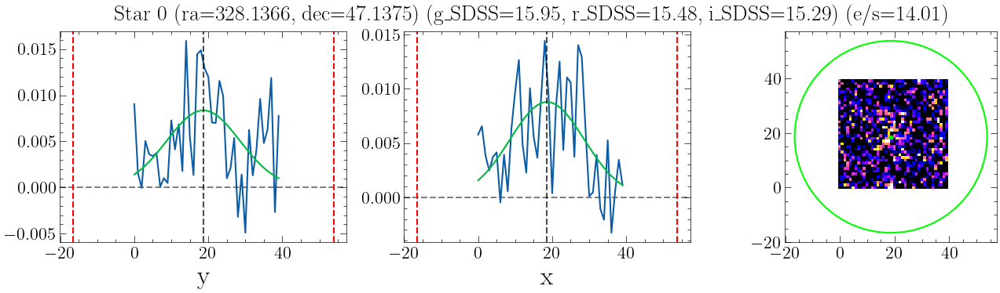

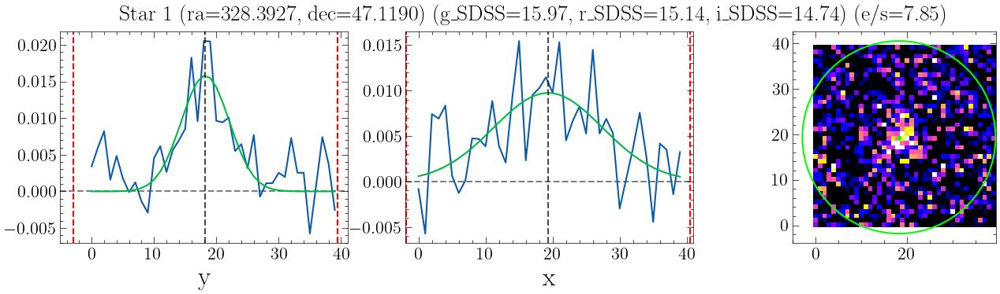

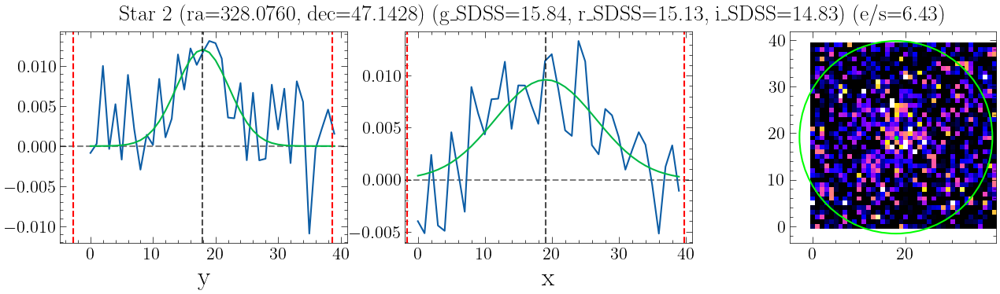

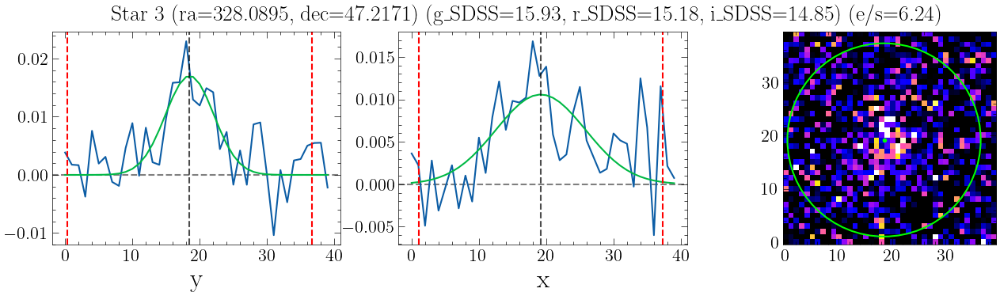

...

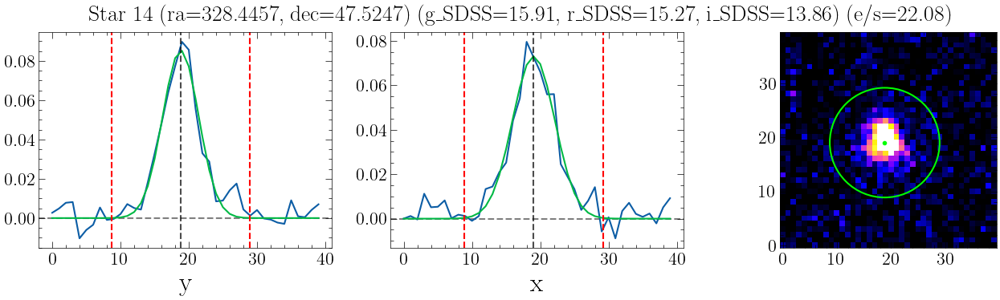

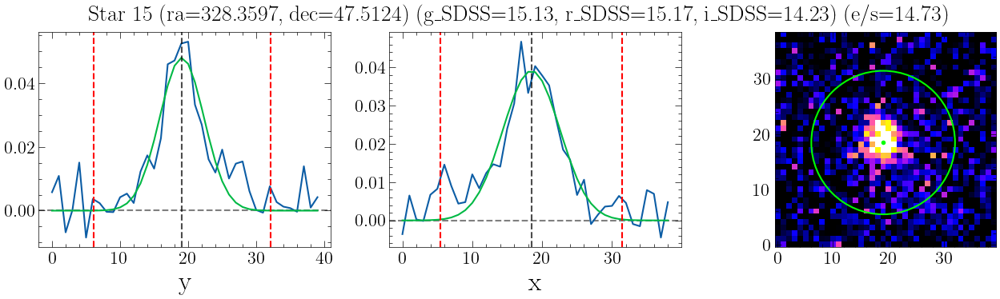

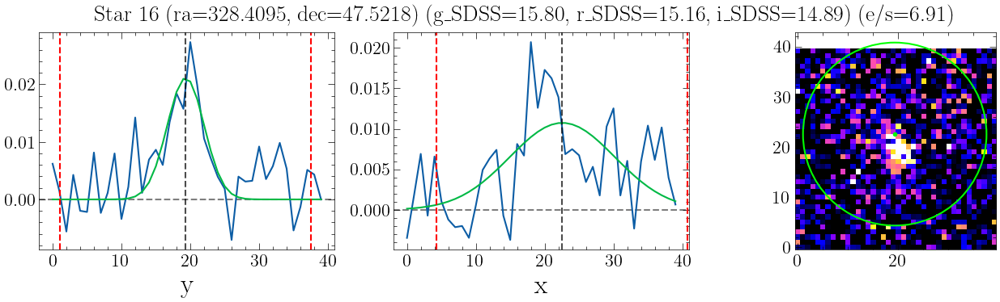

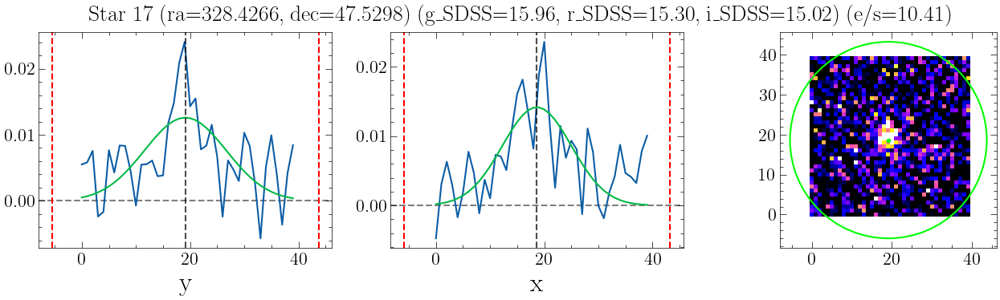

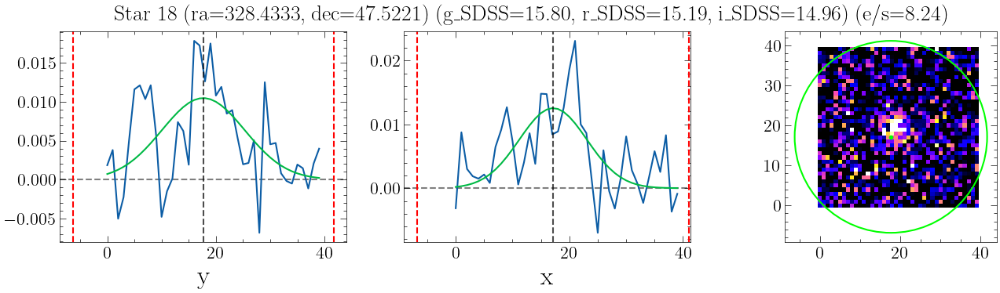

In [11]:
ourfluxes_Ha = Aperture_Photometry(final_Ha, stars_x, stars_y, stars_ra, stars_dec, stars_gmag, stars_rmag, stars_imag)

In [12]:
ourmagnitude_Ha = -2.5*np.log10(ourfluxes_Ha)
truemagnitude_Ha = np.array(stars_rmag) - 0.2568 * (np.array(stars_gmag)-np.array(stars_rmag)) + 0.1470
ZP_array = truemagnitude_Ha - ourmagnitude_Ha
ZP_array

array([18.37540389, 17.31626081, 17.11497865, 17.12730733, 17.06755602,
       17.54506434, 18.01920833, 18.43316297, 19.24333648, 16.48921985,
       18.38966681, 16.99001846, 18.25795411, 16.83382361, 18.61711112,
       18.25126262, 17.24869715, 17.81869742, 17.47061593])

Text(0, 0.5, 'Our magnitude')

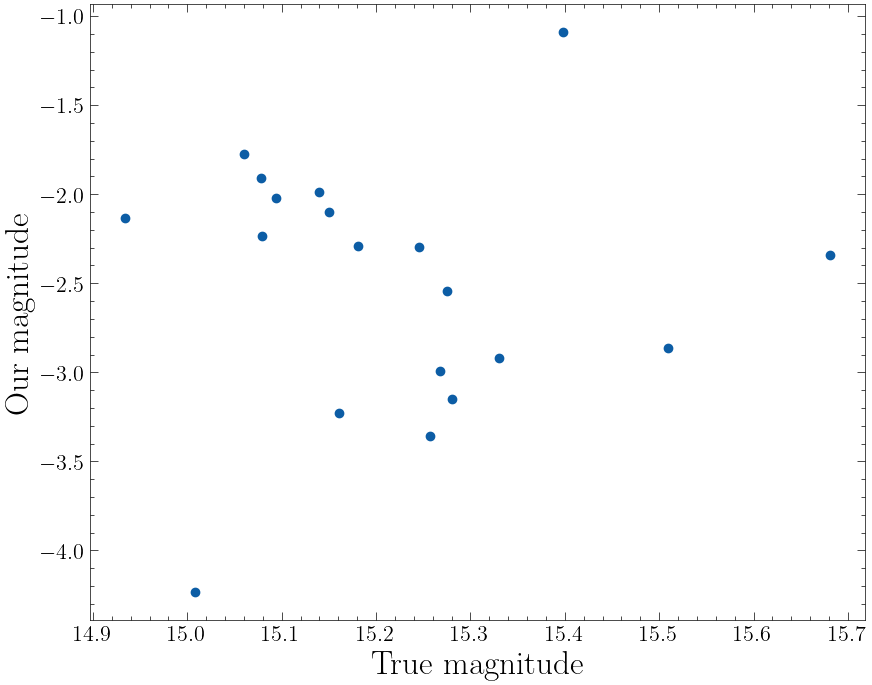

In [13]:
plt.plot(truemagnitude_Ha, ourmagnitude_Ha, 'o')
plt.xlabel('True magnitude')
plt.ylabel('Our magnitude')

In [14]:
print('#', '\t', 'our magnitude' , '\t\t', 'true magnitude')
for i in range(len(ourmagnitude_Ha)):
    print(i, '\t', ourmagnitude_Ha[i] , '\t', truemagnitude_Ha[i])

# 	 our magnitude 		 true magnitude
0 	 -2.8660998922096543 	 15.509304000000002
1 	 -2.2373776081823054 	 15.0788832
2 	 -2.0207930456496968 	 15.0941856
3 	 -1.987880129075158 	 15.1394272
4 	 -2.1334704189587685 	 14.9340856
5 	 -2.299174742291678 	 15.2458896
6 	 -2.3386043325862387 	 15.680604
7 	 -3.152407768181382 	 15.280755200000002
8 	 -4.2355764767688315 	 15.007760000000001
9 	 -1.0914174522837643 	 15.3978024
10 	 -3.2285220142342084 	 15.1611448
11 	 -1.9117032608017472 	 15.078315200000002
12 	 -2.990008514437968 	 15.2679456
13 	 -1.773722012425051 	 15.060101600000001
14 	 -3.359949523970733 	 15.257161599999998
15 	 -2.9207066176925793 	 15.330556000000001
16 	 -2.098737950914554 	 15.1499592
17 	 -2.543928619694331 	 15.2747688
18 	 -2.2897503322661934 	 15.180865599999999


In [15]:
ZP_Ha = ZeroPoint('Ha', ourmagnitude_Ha, stars_rmag, stars_gmag, stars_imag)
ZP_Ha

17.716281363822358

# Filter Hb

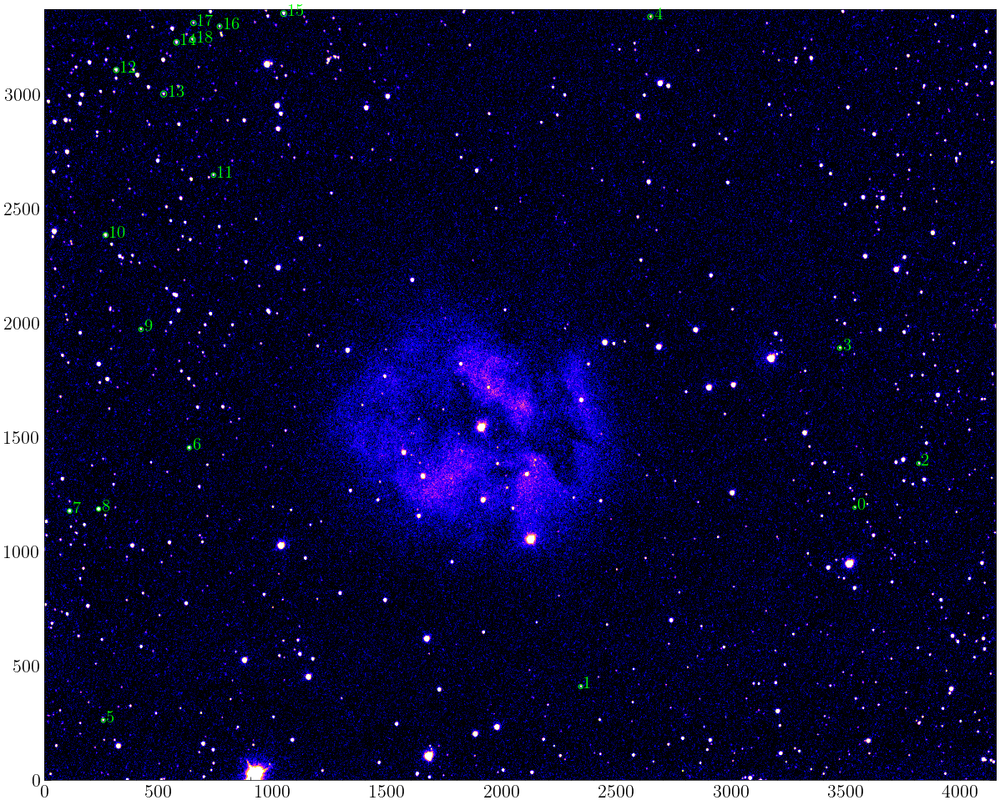

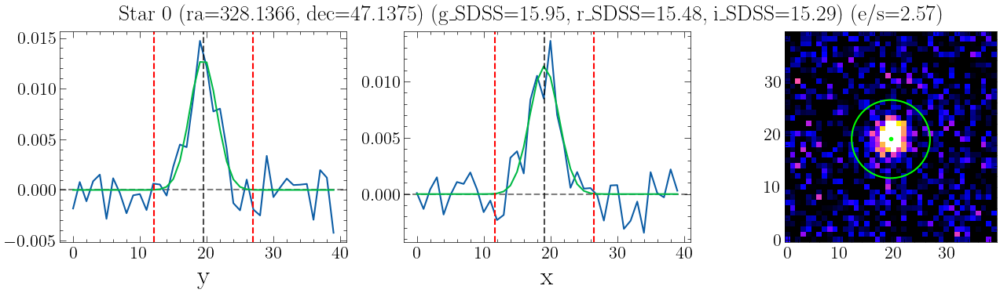

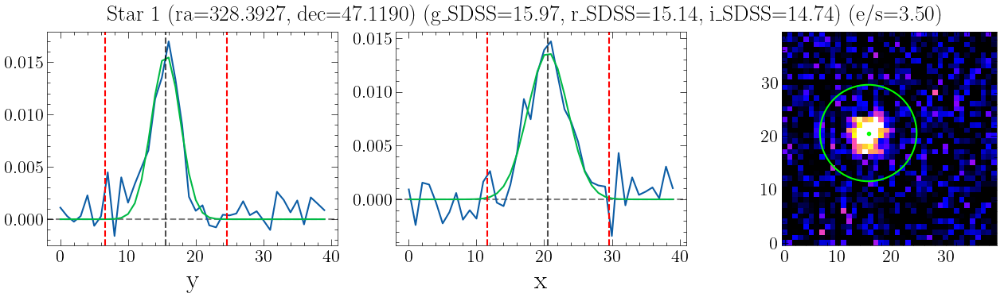

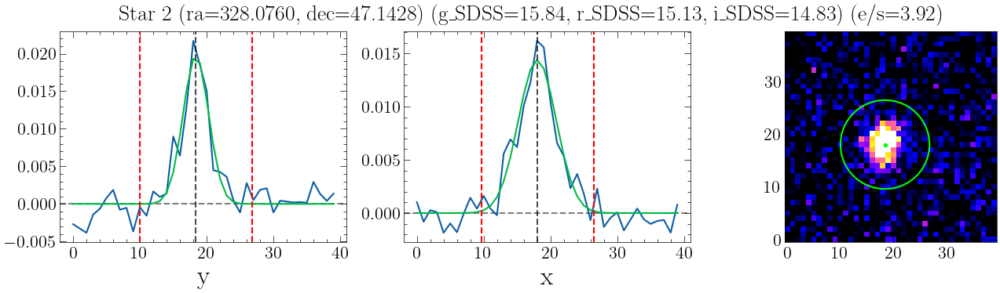

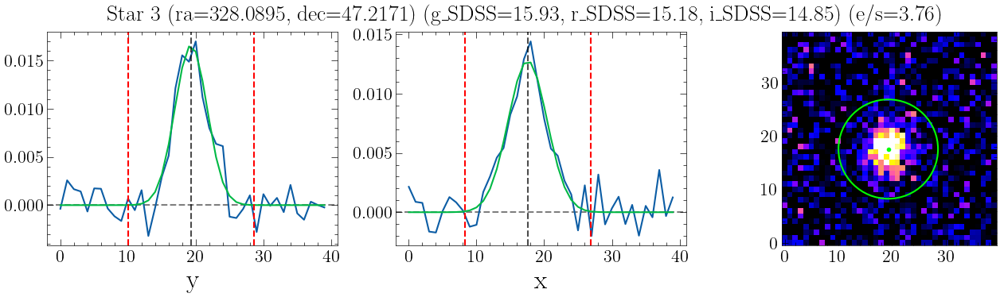

...

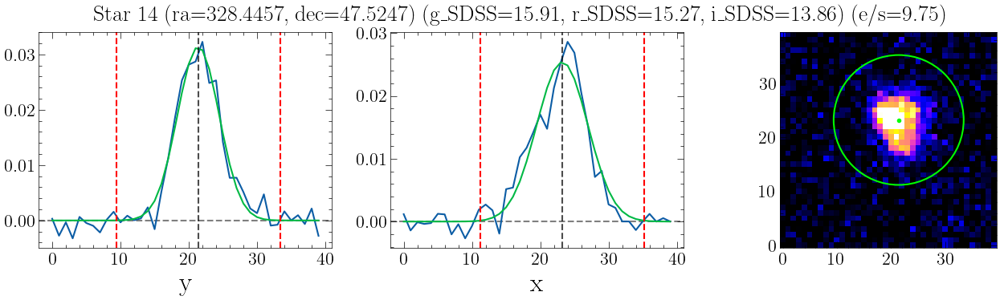

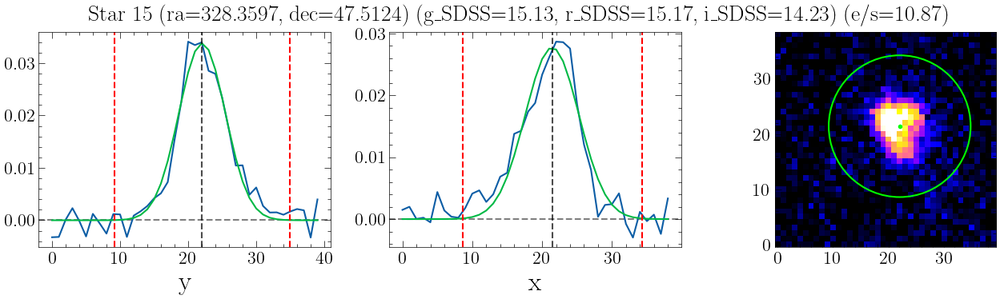

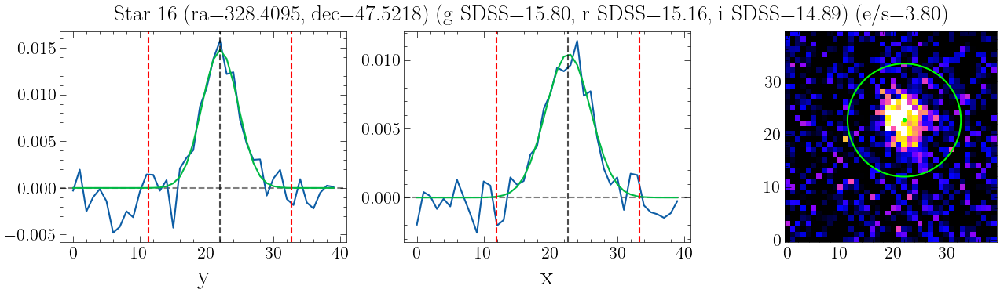

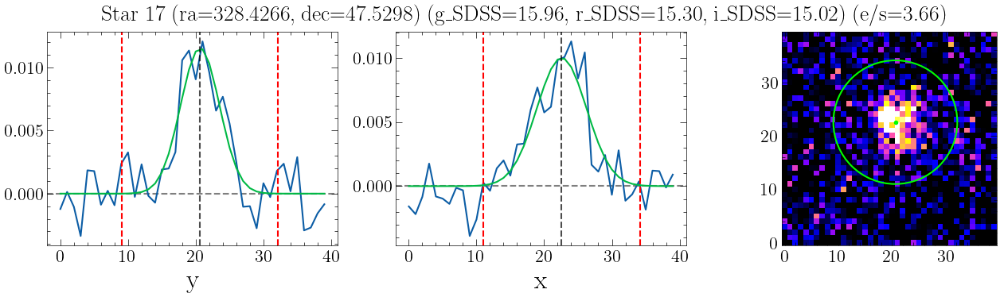

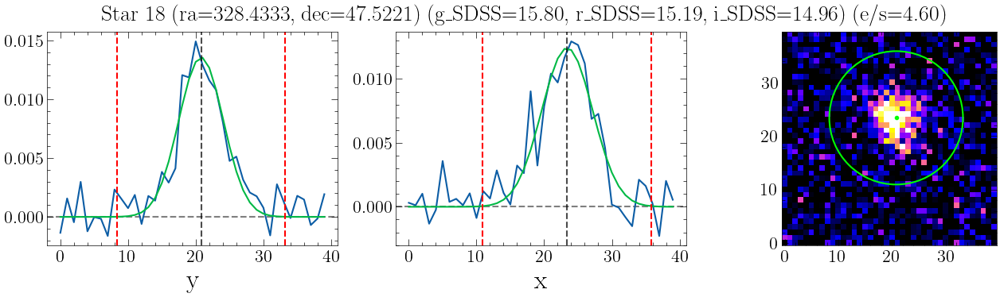

In [16]:
final_Hb = Open_Fits(filepath='Data/final_Hb.fits', plot=False)

ourfluxes_Hb = Aperture_Photometry(final_Hb, stars_x, stars_y, stars_ra, stars_dec, stars_gmag, stars_rmag, stars_imag)

In [17]:
ourmagnitude_Hb = -2.5*np.log10(ourfluxes_Hb)
truemagnitude_Hb = np.array(stars_gmag) - 0.2322 * (np.array(stars_gmag)-np.array(stars_rmag)) - 0.0024
ZP_array = truemagnitude_Hb - ourmagnitude_Hb
ZP_array

array([16.86637875, 17.13495665, 17.15228918, 17.19295037, 17.07564839,
       17.31975283, 17.79265364, 18.17855729, 18.96801923, 16.91850233,
       18.16856599, 17.08625634, 17.88736907, 17.26659042, 18.23442127,
       17.72527448, 17.09678277, 17.20859025, 17.31052213])

In [18]:
print('#', '\t', 'our magnitude' , '\t\t', 'true magnitude')
for i in range(len(ourmagnitude_Hb)):
    print(i, '\t', ourmagnitude_Hb[i] , '\t', truemagnitude_Hb[i])

# 	 our magnitude 		 true magnitude
0 	 -1.0249127487636613 	 15.841466
1 	 -1.3591538514597934 	 15.775802800000001
2 	 -1.4820867841803167 	 15.670202399999999
3 	 -1.438571571204984 	 15.7543788
4 	 -1.4374709937904087 	 15.6381774
5 	 -1.528584434951599 	 15.7911684
6 	 -2.164112636420228 	 15.628541
7 	 -3.0103164879002002 	 15.168240800000001
8 	 -3.5461292320564644 	 15.42189
9 	 -1.1506277301398706 	 15.7678746
10 	 -3.065631789757512 	 15.1029342
11 	 -1.3007755400948005 	 15.7854808
12 	 -2.760626670444743 	 15.1267424
13 	 -1.8814990158356681 	 15.3850914
14 	 -2.472964865173708 	 15.7614564
15 	 -2.590225477302237 	 15.135049
16 	 -1.449700972998658 	 15.6470818
17 	 -1.4080100507831825 	 15.8005802
18 	 -1.6560997261309378 	 15.6544224


In [19]:
ZP_Hb = ZeroPoint('Hb', ourmagnitude_Hb, stars_rmag, stars_gmag, stars_imag)
ZP_Hb

17.504425335757315

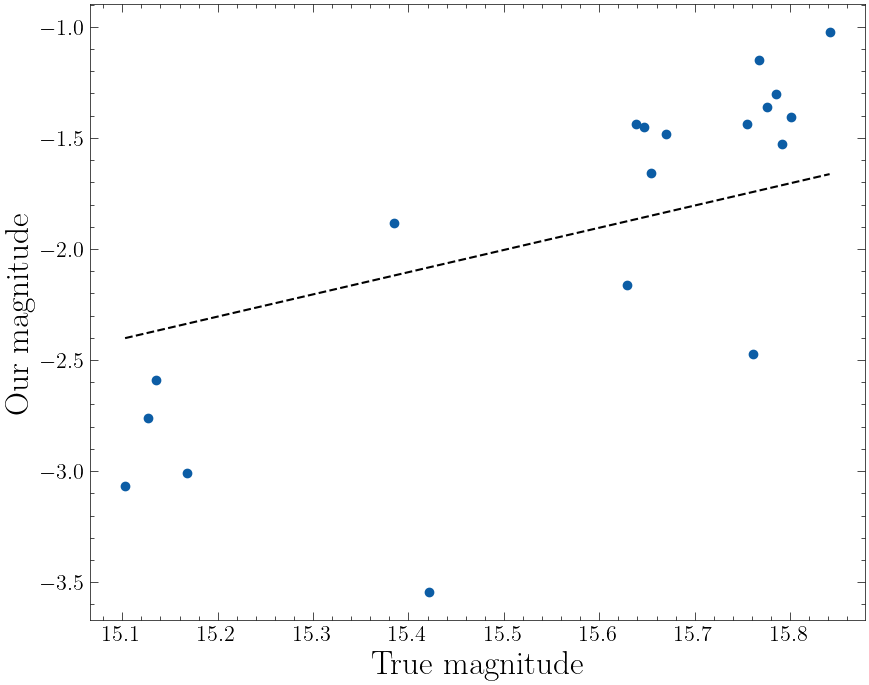

In [20]:
plt.plot(truemagnitude_Hb, ourmagnitude_Hb, 'o')
x_dense = np.linspace(np.min(truemagnitude_Hb), np.max(truemagnitude_Hb), 100)
plt.plot(x_dense, x_dense-ZP_Hb, linestyle='--', color='black')
plt.xlabel('True magnitude')
plt.ylabel('Our magnitude');

# Filter g

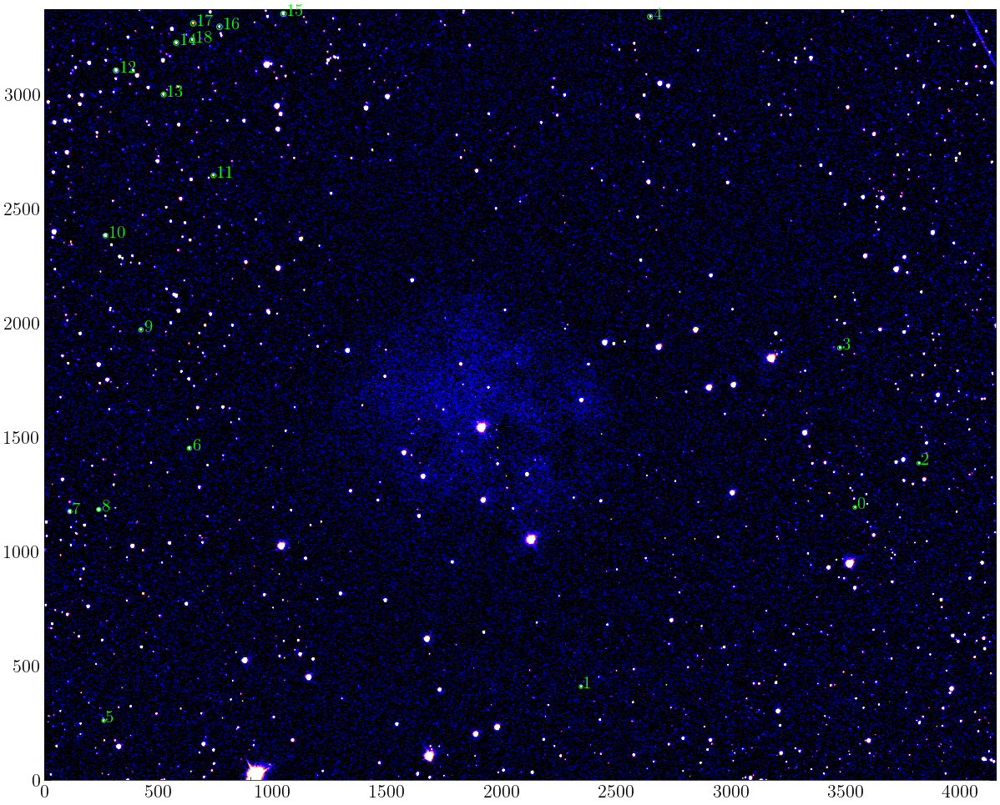

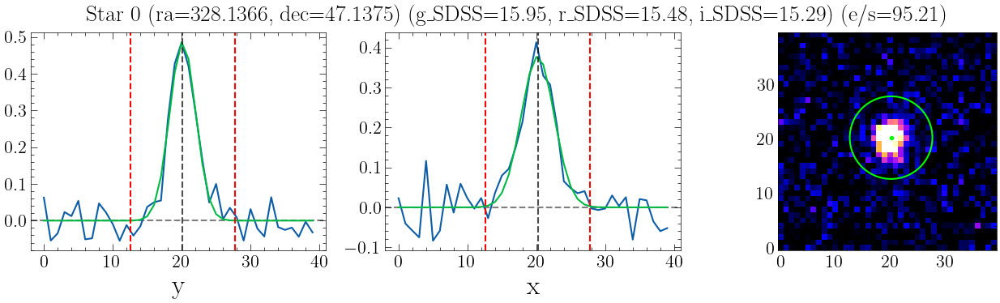

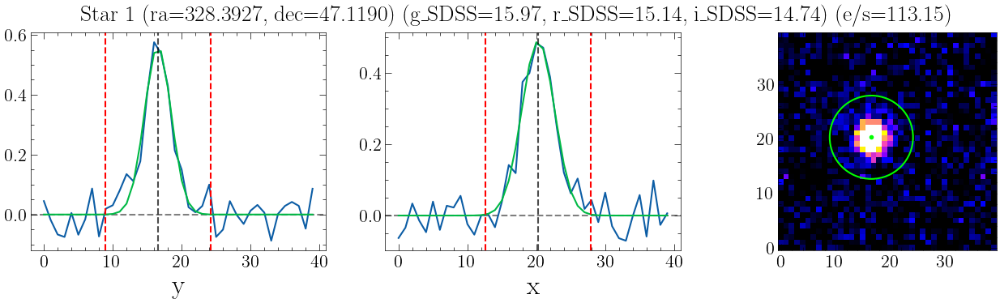

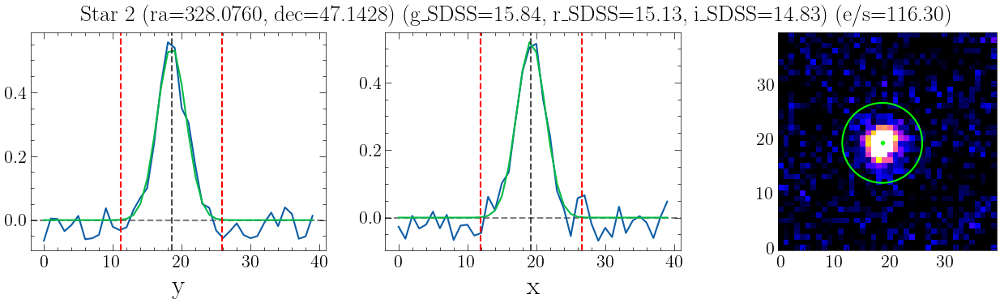

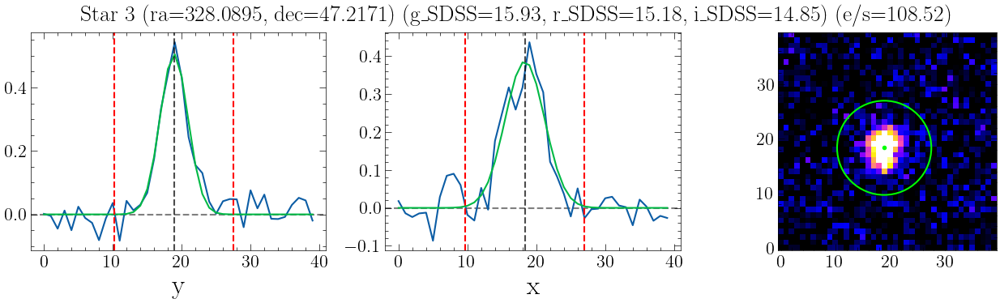

...

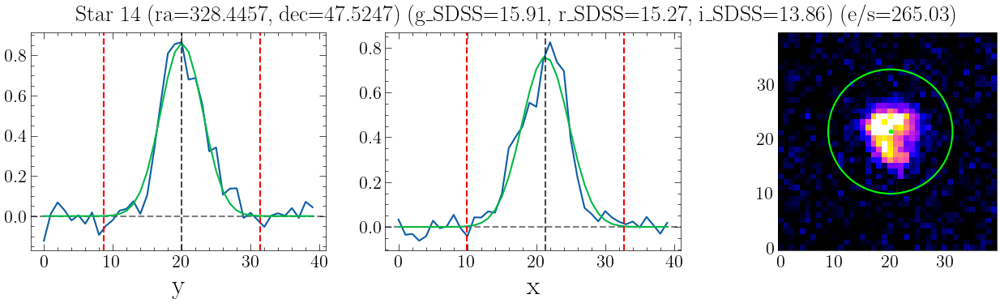

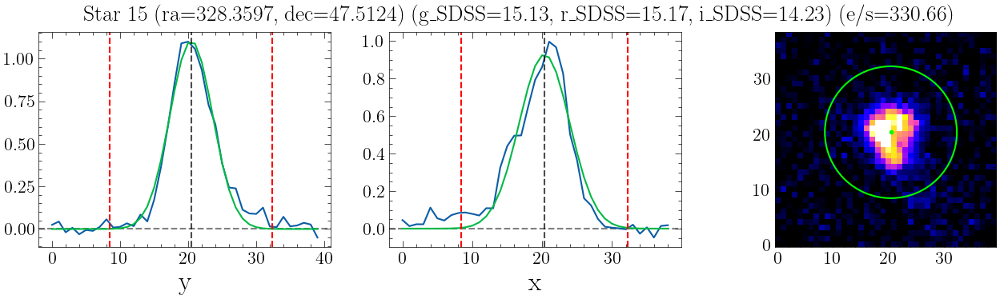

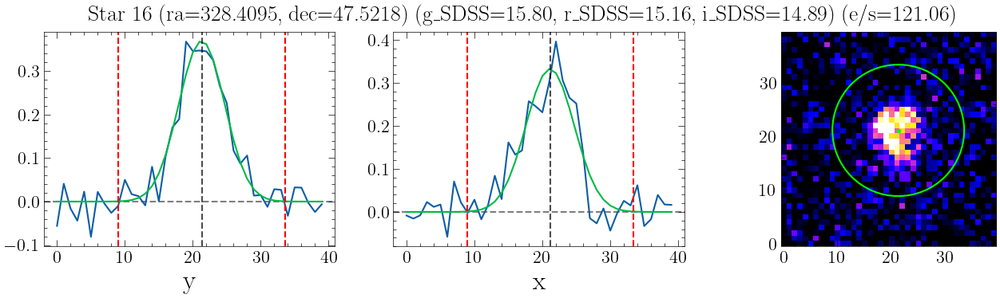

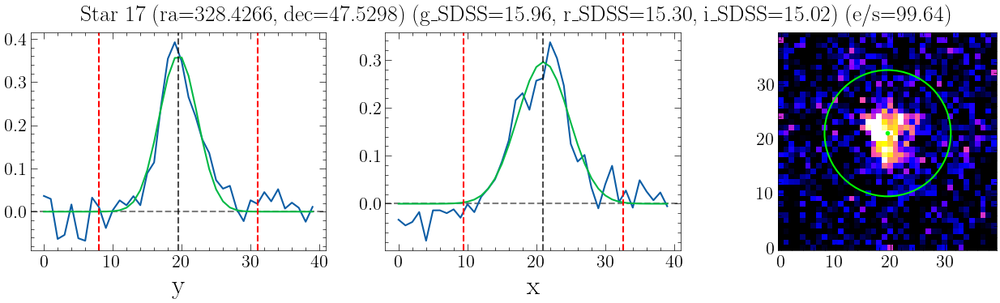

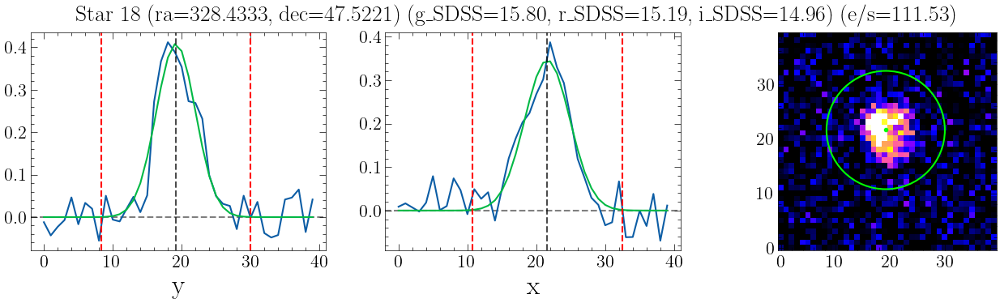

In [21]:
final_g = Open_Fits(filepath='Data/final_g.fits', plot=False)

ourfluxes_g = Aperture_Photometry(final_g, stars_x, stars_y, stars_ra, stars_dec, stars_gmag, stars_rmag, stars_imag)

In [22]:
ourmagnitude_g = -2.5*np.log10(ourfluxes_g)
truemagnitude_g = np.array(stars_gmag) - 0.1205 * (np.array(stars_gmag)-np.array(stars_rmag)) + 0.0012
ZP_array = truemagnitude_g - ourmagnitude_g
ZP_array

array([20.84423463, 21.00580019, 20.91678908, 20.93003639, 20.9395191 ,
       21.01490843, 21.55701299, 21.69997747, 22.6297234 , 20.8759487 ,
       21.80791635, 20.8705613 , 21.56094542, 20.87625004, 21.89457295,
       21.43207977, 20.92865783, 20.87387981, 20.84439453])

In [23]:
print('#', '\t', 'our magnitude' , '\t\t', 'true magnitude')
for i in range(len(ourmagnitude_g)):
    print(i, '\t', ourmagnitude_g[i] , '\t', truemagnitude_g[i])

# 	 our magnitude 		 true magnitude
0 	 -4.946669627229555 	 15.897565
1 	 -5.134133189744917 	 15.871667000000002
2 	 -5.163903078756525 	 15.752886
3 	 -5.0887293925672665 	 15.841307
4 	 -5.204695596033466 	 15.734823500000001
5 	 -5.1444074332897225 	 15.870501
6 	 -5.9142604869583355 	 15.6427525
7 	 -6.52411546887441 	 15.175862
8 	 -7.1427984040218995 	 15.486925000000001
9 	 -5.047842198307463 	 15.8281065
10 	 -6.691440852264902 	 15.1164755
11 	 -4.988099302056105 	 15.882462
12 	 -6.429709422120769 	 15.131236000000001
13 	 -5.435841536187903 	 15.4404085
14 	 -6.05825195173349 	 15.836321000000002
15 	 -6.298457273034667 	 15.133622500000001
16 	 -5.207493329963198 	 15.7211645
17 	 -4.996089314288648 	 15.8777905
18 	 -5.118458526766705 	 15.725936


In [24]:
ZP_g = ZeroPoint('g', ourmagnitude_g, stars_rmag, stars_gmag, stars_imag)
ZP_g

21.237010967589473

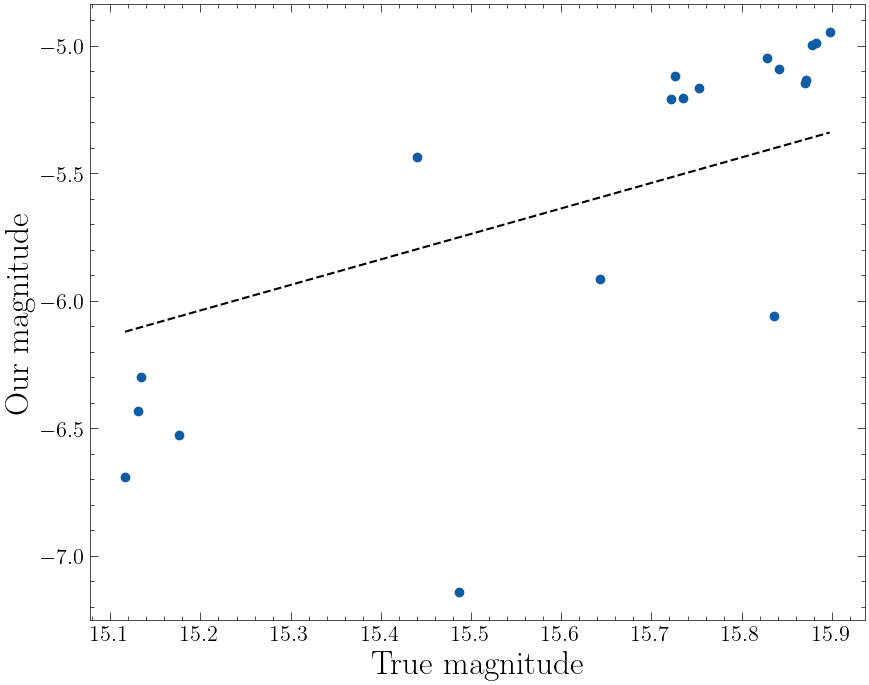

In [25]:
plt.plot(truemagnitude_g, ourmagnitude_g, 'o')
x_dense = np.linspace(np.min(truemagnitude_g), np.max(truemagnitude_g), 100)
plt.plot(x_dense, x_dense-ZP_g, linestyle='--', color='black')
plt.xlabel('True magnitude')
plt.ylabel('Our magnitude');

# Filter r

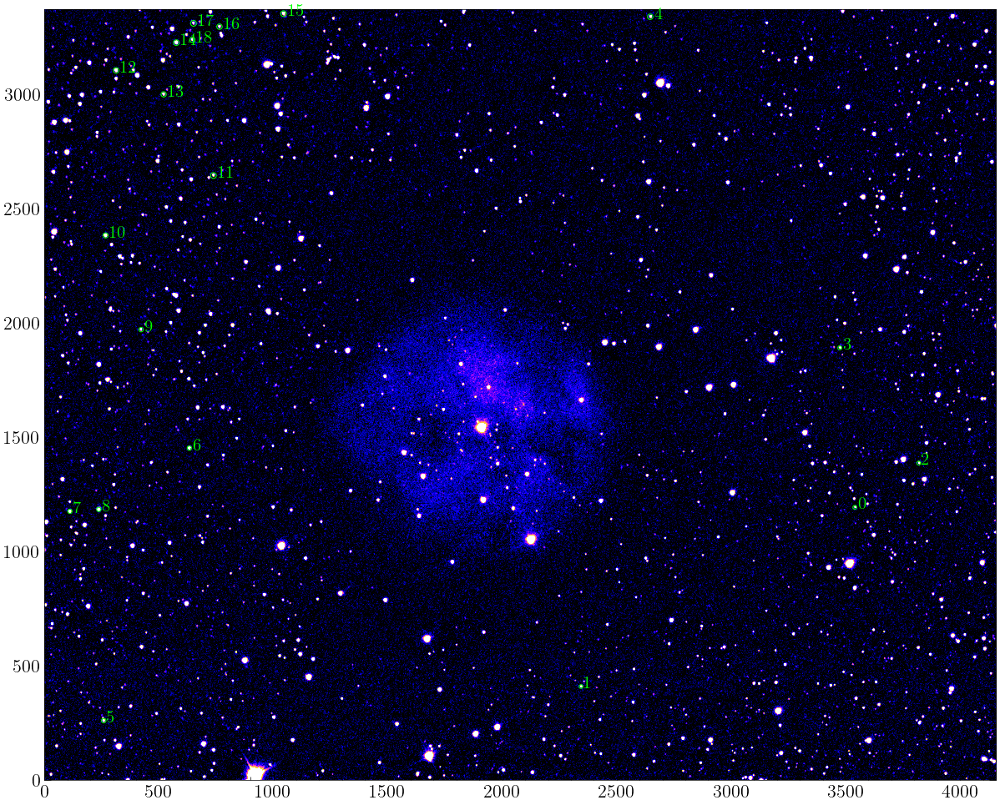

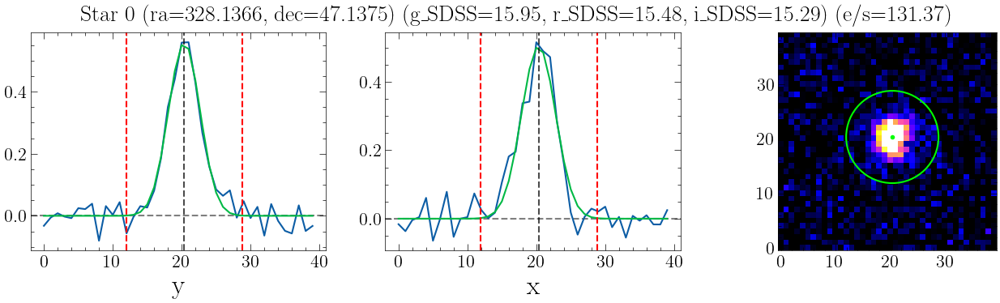

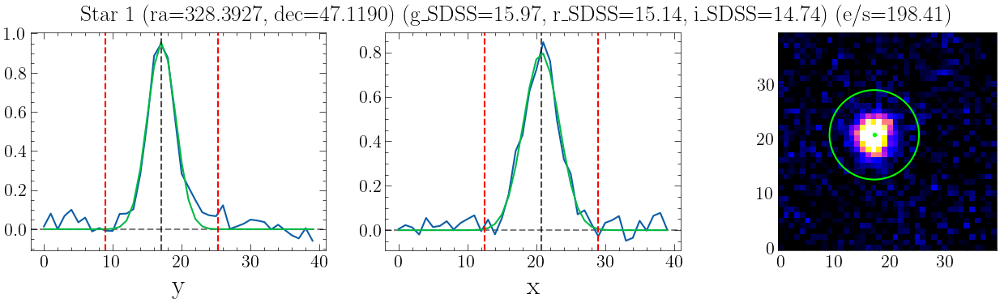

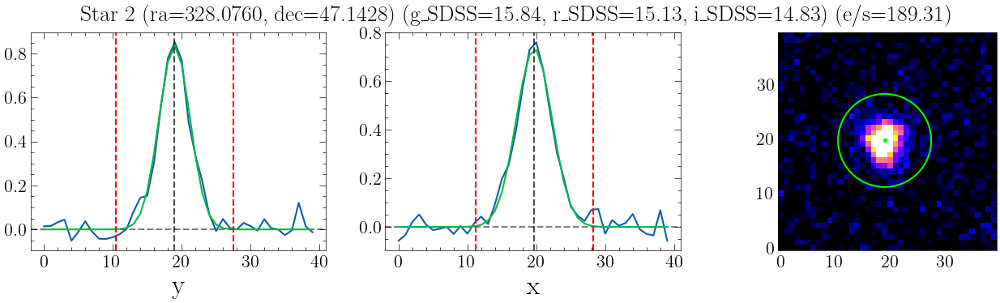

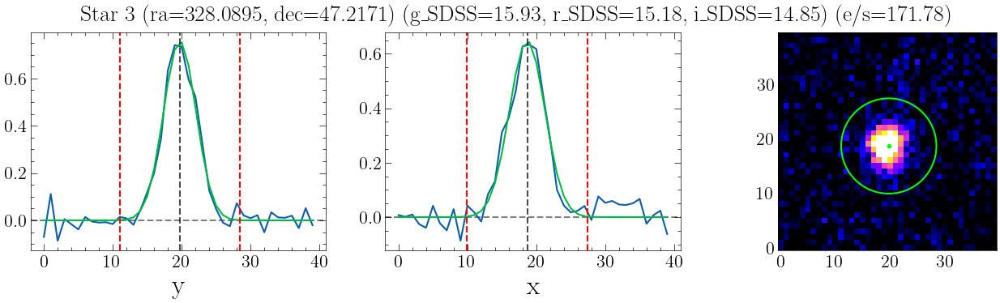

...

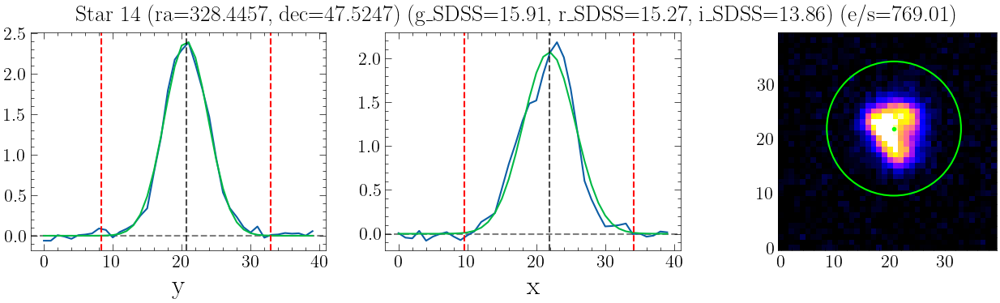

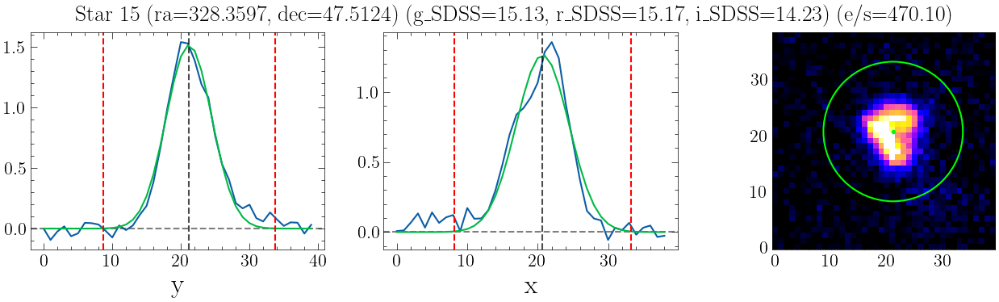

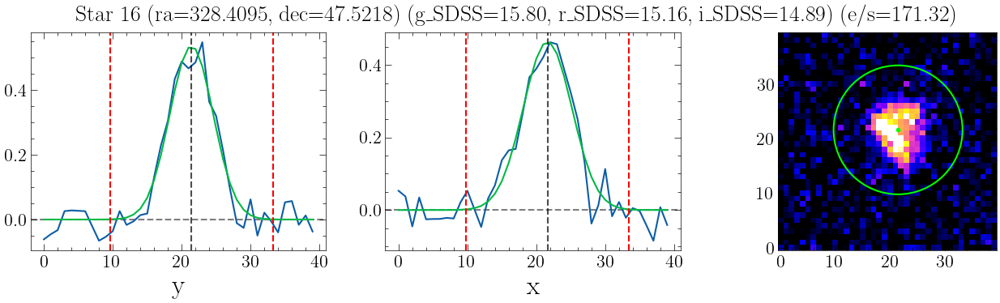

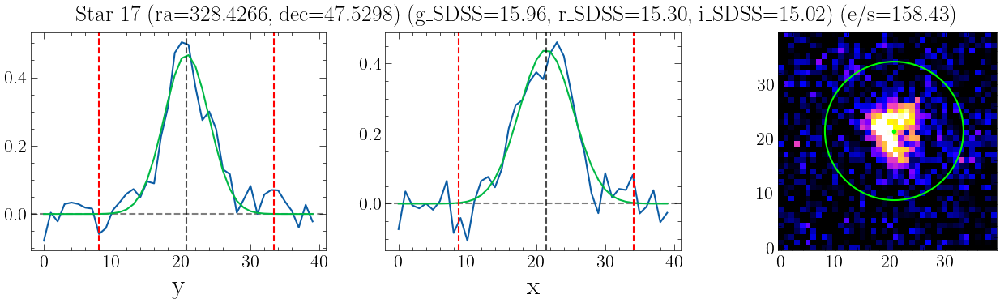

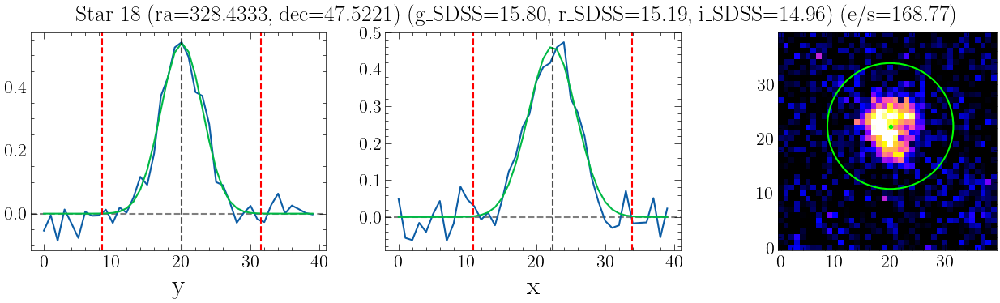

In [26]:
final_r = Open_Fits(filepath='Data/final_r.fits', plot=False)

ourfluxes_r = Aperture_Photometry(final_r, stars_x, stars_y, stars_ra, stars_dec, stars_gmag, stars_rmag, stars_imag)

In [27]:
ourmagnitude_r = -2.5*np.log10(ourfluxes_r)
truemagnitude_r = np.array(stars_gmag) - 0.0061 * (np.array(stars_gmag)-np.array(stars_rmag)) + 0.0001
ZP_array = truemagnitude_r - ourmagnitude_r
ZP_array

array([21.2464512 , 21.70899601, 21.52571737, 21.51300313, 21.64954237,
       21.88925452, 22.14365632, 22.33083667, 23.70432722, 21.28639925,
       22.385585  , 21.63830377, 22.00419743, 21.20586487, 23.12304364,
       21.80786127, 21.37675456, 21.45169033, 21.36264803])

In [28]:
print('#', '\t', 'our magnitude' , '\t\t', 'true magnitude')
for i in range(len(ourmagnitude_r)):
    print(i, '\t', ourmagnitude_r[i] , '\t', truemagnitude_r[i])

# 	 our magnitude 		 true magnitude
0 	 -5.296218204918166 	 15.950232999999999
1 	 -5.7439346112823255 	 15.9650614
2 	 -5.692936165350357 	 15.8327812
3 	 -5.587453728446209 	 15.9255494
4 	 -5.820523674593124 	 15.829018699999999
5 	 -5.942290323779435 	 15.9469642
6 	 -6.491135818318118 	 15.6525205
7 	 -7.151956268399947 	 15.1788804
8 	 -8.155582220202067 	 15.548745
9 	 -5.40139194870648 	 15.8850073
10 	 -7.2600279049884895 	 15.1255571
11 	 -5.661303373431919 	 15.9770004
12 	 -6.8731462282808495 	 15.1310512
13 	 -5.713589172624096 	 15.492275699999999
14 	 -7.21483544180339 	 15.9082082
15 	 -6.680486772212367 	 15.1273745
16 	 -5.584503662746635 	 15.792250899999999
17 	 -5.499610225673917 	 15.9520801
18 	 -5.5682568320722865 	 15.7943912


In [29]:
ZP_r = ZeroPoint('r', ourmagnitude_r, stars_rmag, stars_gmag, stars_imag)
ZP_r

21.369375419885795

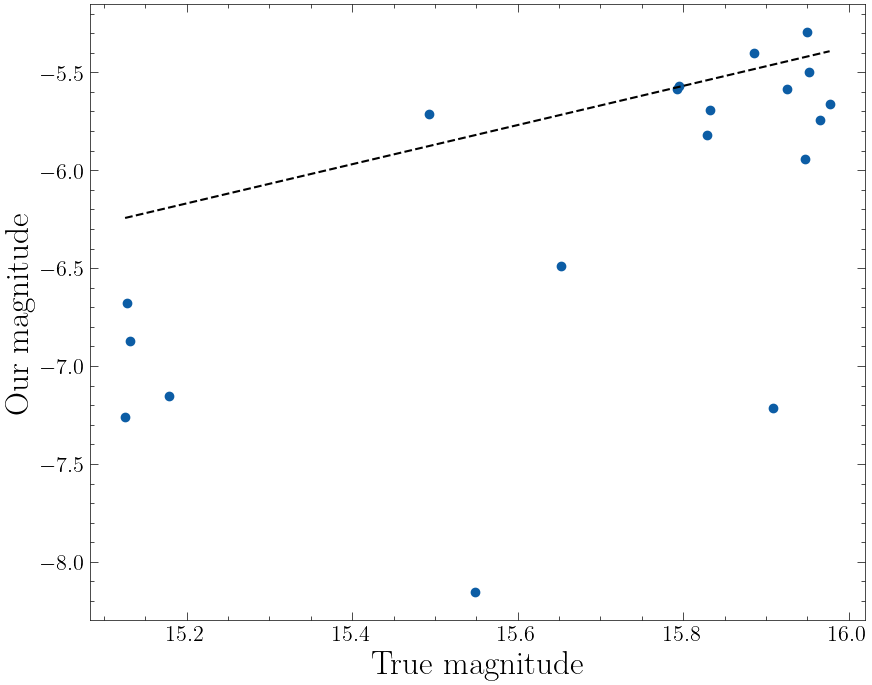

In [30]:
plt.plot(truemagnitude_r, ourmagnitude_r, 'o')
x_dense = np.linspace(np.min(truemagnitude_r), np.max(truemagnitude_r), 100)
plt.plot(x_dense, x_dense-ZP_r, linestyle='--', color='black')
plt.xlabel('True magnitude')
plt.ylabel('Our magnitude');

# Filter i

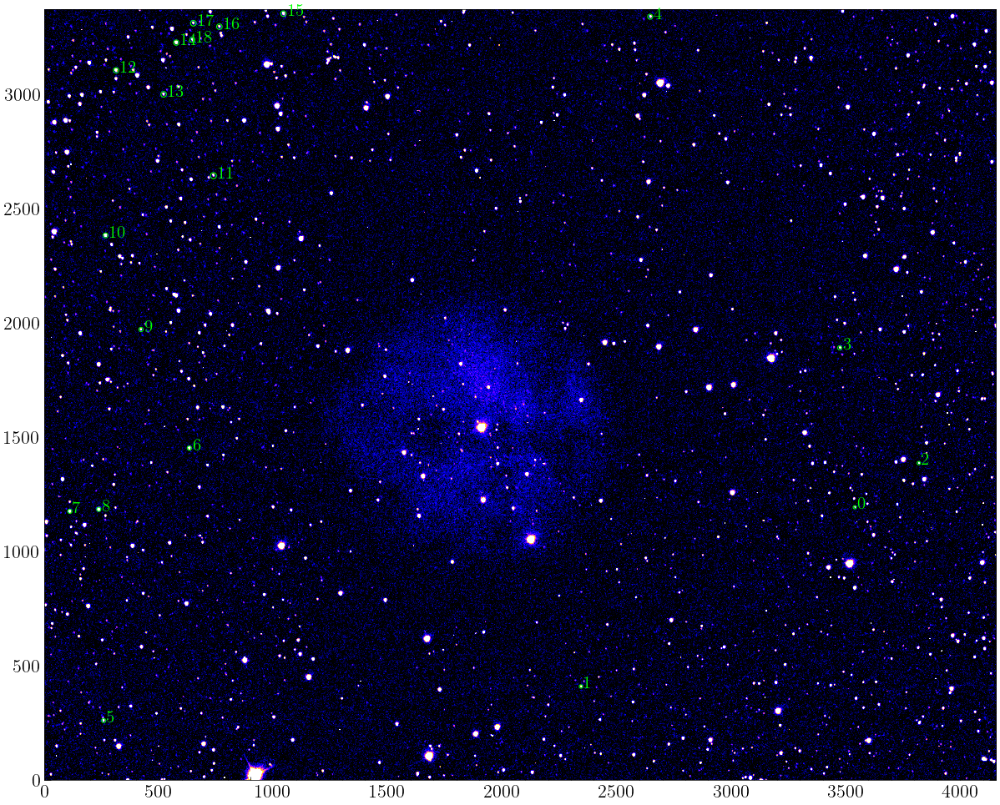

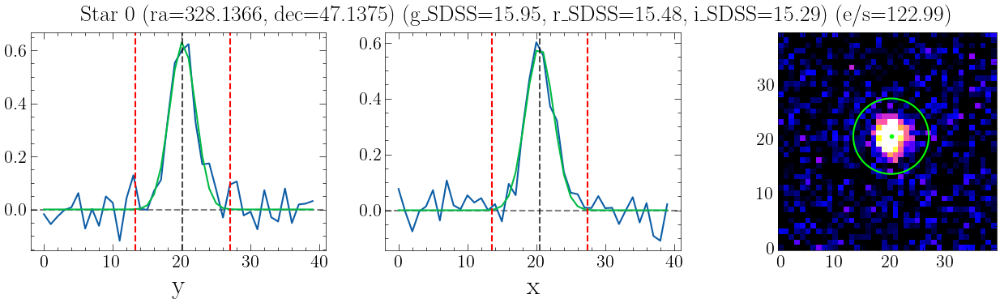

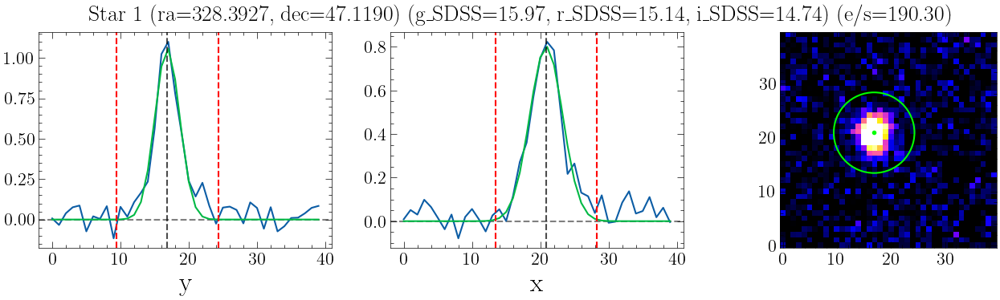

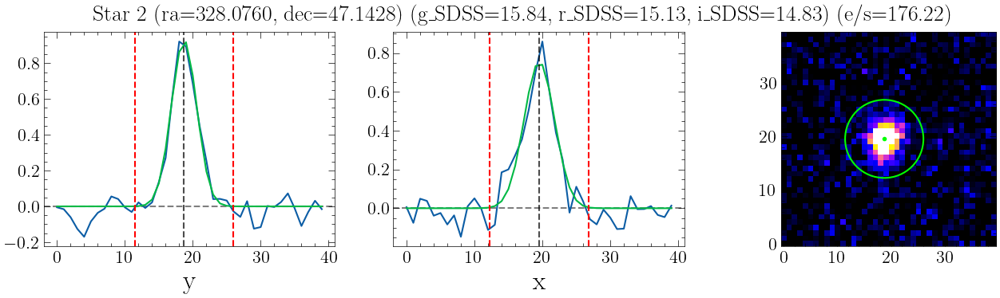

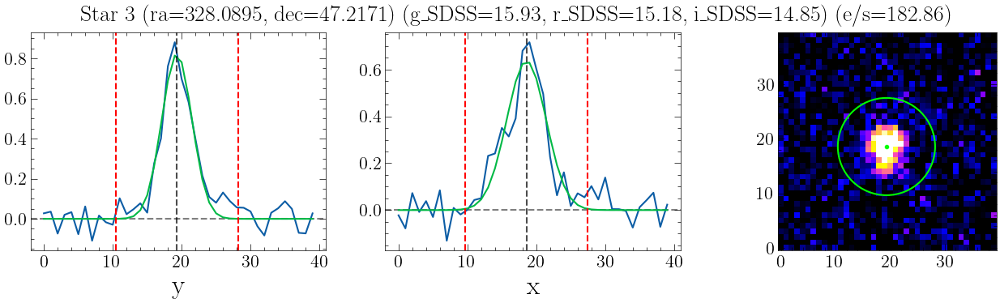

...

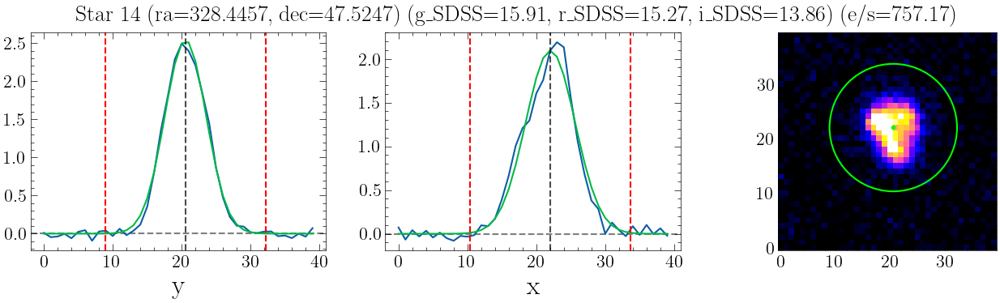

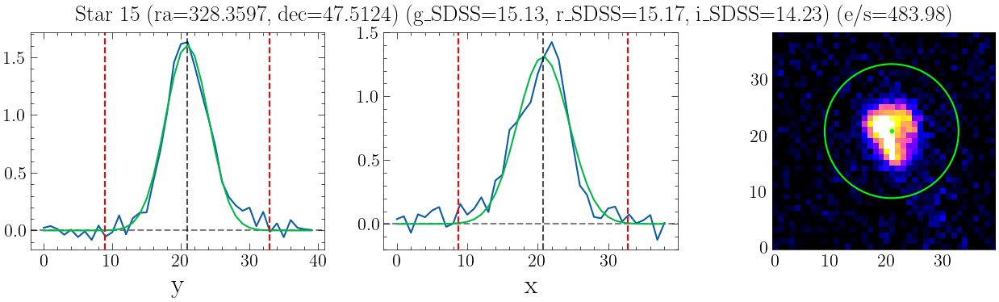

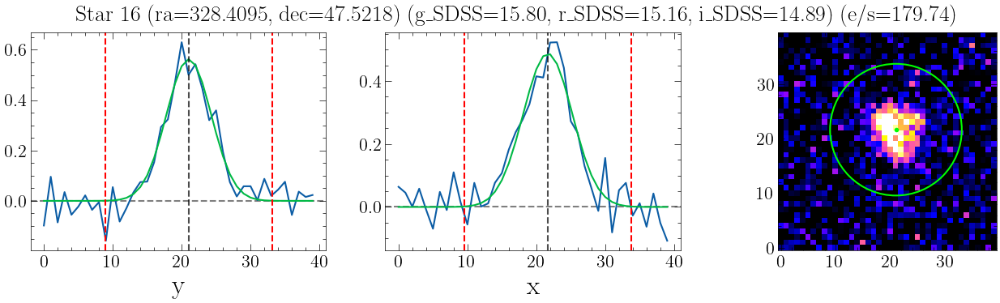

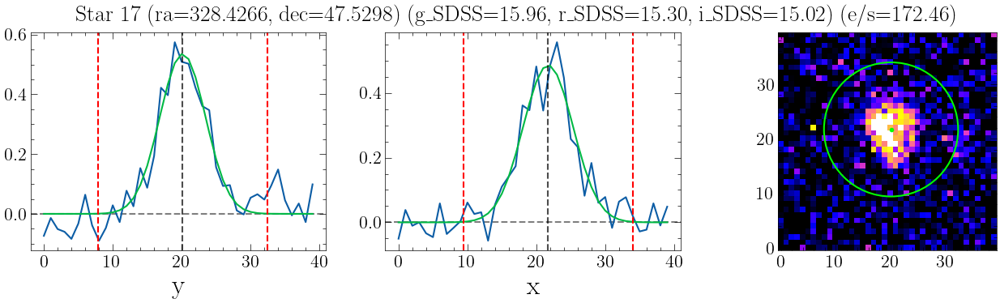

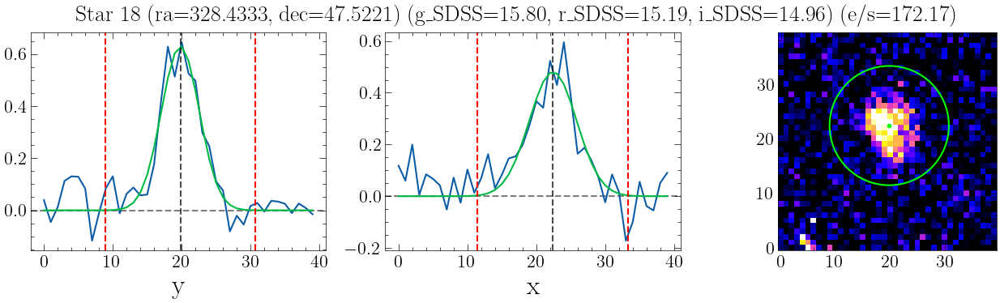

In [31]:
final_i = Open_Fits(filepath='Data/final_i.fits', plot=False)

ourfluxes_i = Aperture_Photometry(final_i, stars_x, stars_y, stars_ra, stars_dec, stars_gmag, stars_rmag, stars_imag)

In [32]:
ourmagnitude_i = -2.5*np.log10(ourfluxes_i)
truemagnitude_i = np.array(stars_imag) - 0.0609 * (np.array(stars_rmag)-np.array(stars_imag)) + 0.0049
ZP_array = truemagnitude_i - ourmagnitude_i
ZP_array

array([20.51316256, 20.42206587, 20.43606188, 20.49411825, 20.36193678,
       20.70130229, 20.79627349, 21.01073311, 21.88231225, 20.54866697,
       21.11013768, 20.44539585, 20.89864171, 20.64235925, 20.97889764,
       20.88748114, 20.514775  , 20.60291923, 20.53652324])

In [33]:
print('#', '\t', 'our magnitude' , '\t\t', 'true magnitude')
for i in range(len(ourmagnitude_i)):
    print(i, '\t', ourmagnitude_i[i] , '\t', truemagnitude_i[i])

# 	 our magnitude 		 true magnitude
0 	 -5.224711757933298 	 15.2884508
1 	 -5.69858677043042 	 14.723479099999999
2 	 -5.6151273816831555 	 14.820934499999998
3 	 -5.655315252231819 	 14.838802999999999
4 	 -5.777214079638817 	 14.584722699999999
5 	 -5.829726992141594 	 14.8715753
6 	 -6.508575287580305 	 14.2876982
7 	 -7.157131111781972 	 13.853601999999999
8 	 -8.163344852090283 	 13.718967399999999
9 	 -5.382373272821715 	 15.166293699999999
10 	 -7.253262984983227 	 13.856874699999999
11 	 -5.681724346279938 	 14.7636715
12 	 -6.881504014462056 	 14.0171377
13 	 -5.772020552369568 	 14.8703387
14 	 -7.197988442732347 	 13.7809092
15 	 -6.712070738537884 	 14.175410399999999
16 	 -5.636622498913605 	 14.8781525
17 	 -5.5917058343033545 	 15.011213399999999
18 	 -5.589873844298915 	 14.946649399999998


In [34]:
ZP_i = ZeroPoint('i', ourmagnitude_i, stars_rmag, stars_gmag, stars_imag)
ZP_i

20.725461274484957

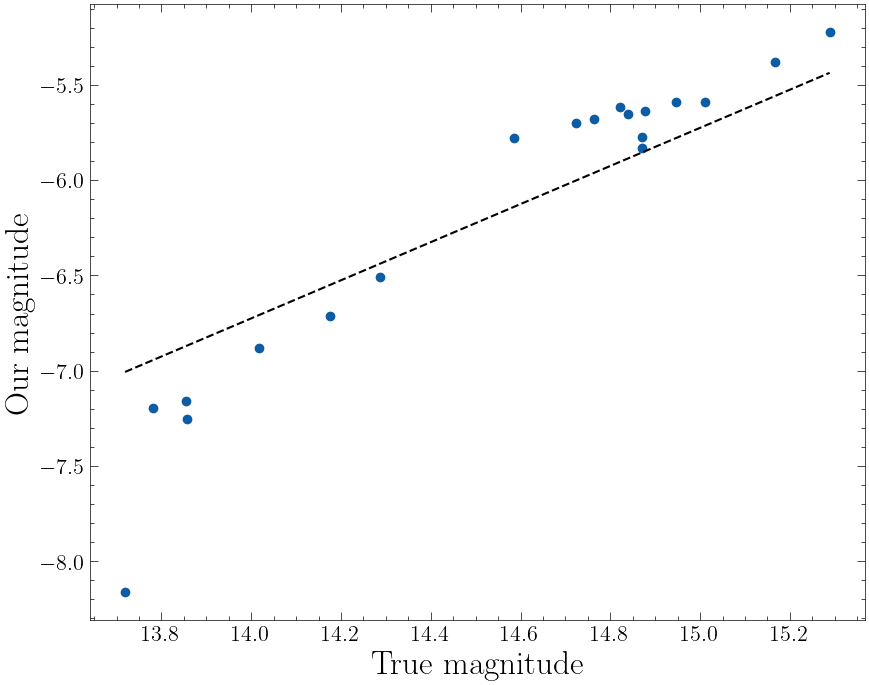

In [35]:
plt.plot(truemagnitude_i, ourmagnitude_i, 'o')
x_dense = np.linspace(np.min(truemagnitude_i), np.max(truemagnitude_i), 100)
plt.plot(x_dense, x_dense-ZP_i, linestyle='--', color='black')
plt.xlabel('True magnitude')
plt.ylabel('Our magnitude');

# Science?

$ \mathrm{flux}_{\mathrm{H}\alpha}/\mathrm{flux}_{\mathrm{H}\beta} \approx 2.86^{+0.18}_{-0.11} $

$D = \frac{f_{\mathrm{H}\alpha}}{f_{\mathrm{H}\beta}} - 2.9 = (R_\alpha / R_\beta) 10^{-0.4(ZP_{\alpha} - ZP_{\beta})} - 2.9$  Minimo X>0.2 perché abbia qualche senso

Area nebulosa divisa in 3000 sezioni da 180 pixel, per noi sarebbero circa 450 pixel per sezione (Binning 0.0167 × 0.0167 × 0.0167 dex^3 ?)

https://www.aanda.org/articles/aa/full_html/2023/02/aa45072-22/aa45072-22.html